<a href="https://colab.research.google.com/github/fatalistix/smgmo/blob/main/lab3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Импорт используемых библиотек и глобальные переменные

In [ ]:
import torch
from torch import nn, optim
from torch.nn import modules
import torch.nn.functional as func

import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
import math
import time

from tqdm import tqdm

rng = np.random.default_rng()

# Из лабораторной работы 2

Сортировка сгенерированной выборки

In [ ]:
def sort_dataset(dset):
  __x_d = [dset[i][0][0] for i in range(len(dset))]
  __y_d = [dset[i][0][1] for i in range(len(dset))]
  __l_d = [dset[i][1] for i in range(len(dset))]

  d_0_x = []
  d_0_y = []
  d_1_x = []
  d_1_y = []

  for i in range(len(__x_d)):
    if __l_d[i] == 0:
      d_0_x.append(__x_d[i])
      d_0_y.append(__y_d[i])
    else:
      d_1_x.append(__x_d[i])
      d_1_y.append(__y_d[i])

  return d_0_x, d_0_y, d_1_x, d_1_y

## Выборка в виде круга и кольца

In [ ]:
def generate_circle_dataset(
  num_points,
  internal_circle_radius,
  outer_low_radius,
  outer_high_radius,
  center,
  eps):
  dataset = []
  shift = outer_low_radius - internal_circle_radius
  global_radius = outer_high_radius - shift
  for i in range(num_points):
    r = rng.uniform(0, global_radius)
    a = rng.uniform(0, 2 * math.pi)
    label = 1 if r > internal_circle_radius else 0

    r_with_err = r + rng.uniform(-eps, eps)
    a_with_err = a + rng.uniform(-eps, eps)

    r_final = r_with_err + shift if r_with_err > internal_circle_radius else r_with_err
    a_final = a_with_err

    x_final = r_final * math.cos(a_final) + center[0]
    y_final = r_final * math.sin(a_final) + center[1]

    dataset.append(([x_final, y_final], label))
  return dataset

## XOR выборка

In [ ]:
def generate_xor_dataset(num_points, radius, center, eps):
  dataset = []
  for _ in range(num_points):
    x = rng.uniform(-radius, radius)
    y = rng.uniform(-radius, radius)
    label = 1 if (x >= 0 and y < 0) or (x < 0 and y >= 0) else 0
    x_with_err = x + rng.uniform(-eps, eps)
    y_with_err = y + rng.uniform(-eps, eps)
    x_final = x_with_err + center[0]
    y_final = y_with_err + center[1]
    dataset.append(([x_final, y_final], label))
  return dataset

## Выборка по Гауссу

In [ ]:
def generate_gaussian_dataset(num_points, shift, scale, center, eps):
    dataset = []
    for _ in range(num_points // 2):
        x = rng.normal(shift[0], scale[0])
        y = rng.normal(shift[1], scale[1])
        label = 1
        x_with_err = x + rng.uniform(-eps, eps)
        y_with_err = y + rng.uniform(-eps, eps)
        x_final = x_with_err + center[0]
        y_final = y_with_err + center[1]
        dataset.append(([x_final, y_final], 1))

        x = rng.normal(-shift[0], scale[0])
        y = rng.normal(-shift[1], scale[1])
        x_with_err = x + rng.uniform(-eps, eps)
        y_with_err = y + rng.uniform(-eps, eps)
        x_final = x_with_err + center[0]
        y_final = y_with_err + center[1]
        dataset.append(([x_final, y_final], 0))

    return dataset

## Выборка в виде спирали

In [ ]:
def generate_spiral_dataset(num_points, eps):
  n = num_points // 2
  dataset = []
  for i in range(n):
    r = i / n * 5
    t = 1.75 * i / n * 2 * math.pi
    x = r * math.sin(t) + rng.uniform(-eps, eps)
    y = r * math.cos(t) + rng.uniform(-eps, eps)
    dataset.append(([x, y], 1))

  for i in range(n):
    r = i / n * 5
    t = 1.75 * i / n * 2 * math.pi + math.pi
    x = r * math.sin(t) + rng.uniform(-eps, eps)
    y = r * math.cos(t) + rng.uniform(-eps, eps)
    dataset.append(([x, y], 0))

  return dataset

# Генерация выборок

## Параметры выборки

In [ ]:
N = 100
N_train = 10

## Выборка в виде круга и кольца

In [ ]:
CIRCLE_INNER_RADIUS = 2
CIRCLE_OUTTER_INNER_RADIUS = 3
CIRCLE_OUTTER_OUTTER_RADIUS = 4.5
CIRCLE_CENTER = [0, 0]
CIRCLE_ERR = 0.1
circle_dataset = generate_circle_dataset(N, CIRCLE_INNER_RADIUS, CIRCLE_OUTTER_INNER_RADIUS, CIRCLE_OUTTER_OUTTER_RADIUS, CIRCLE_CENTER, CIRCLE_ERR)
circle_dataset_train = generate_circle_dataset(N_train, CIRCLE_INNER_RADIUS, CIRCLE_OUTTER_INNER_RADIUS, CIRCLE_OUTTER_OUTTER_RADIUS, CIRCLE_CENTER, CIRCLE_ERR)

## XOR выборка

In [ ]:
XOR_RADIUS = 5
XOR_CENTER = [0, 0]
XOR_ERR = 0.1
xor_dataset = generate_xor_dataset(N, XOR_RADIUS, XOR_CENTER, XOR_ERR)
xor_dataset_train = generate_xor_dataset(N_train, XOR_RADIUS, XOR_CENTER, XOR_ERR)

## Выборка по Гауссу

In [ ]:
GAUSS_SHIFT = [4, 4] # Задается для x и y, одинаковый для обеих выборок за исключением смены знака
GAUSS_SCALE = [3, 3] # Задается для x и y
GAUSS_CENTER = [0, 0]
GAUSS_ERR = 0.1
gaussian_dataset = generate_gaussian_dataset(N, GAUSS_SHIFT, GAUSS_SCALE, GAUSS_CENTER, GAUSS_ERR)
gaussian_dataset_train = generate_gaussian_dataset(N_train, GAUSS_SHIFT, GAUSS_SCALE, GAUSS_CENTER, GAUSS_ERR)

## Выборка в виде спирали

In [ ]:
SPIRAL_ERR = 0.1
spiral_dataset = generate_spiral_dataset(N, SPIRAL_ERR)
spiral_dataset_train = generate_spiral_dataset(N_train, SPIRAL_ERR)

# Класс многослойного перцептрона

In [ ]:
class MLP(nn.Module):
    def __init__(self, input_size, hidden_sizes, output_size, activation):
        super(MLP, self).__init__()
        layers = []
        layers.append(nn.Linear(input_size, hidden_sizes[0] if len(hidden_sizes) != 0 else output_size))
        layers.append(activation())
        for i in range(len(hidden_sizes) - 1):
            layers.append(nn.Linear(hidden_sizes[i], hidden_sizes[i + 1]))
            layers.append(activation())
        layers.append(nn.Linear(hidden_sizes[-1] if len(hidden_sizes) != 0 else input_size, output_size))

        self.stack = nn.Sequential(*layers)

    def forward(self, x):
        x = self.stack(x)
        return x

In [ ]:
def fit(model, epochs: int, dataloader, optimizer, loss_f):
  accuracies = []
  for epoch in tqdm(range(epochs)):
    model.train()

    for x, label in dataloader:
      optimizer.zero_grad()

      pred = model(x)

      loss = loss_f(pred, label)

      loss.backward()
      optimizer.step()

    model.eval()
    if (epoch + 1) % 100 == 0:
      accuracy = accuracy_score(label.numpy(), np.argmax(model(x).detach().numpy(), axis=1))
      print(f'Epoch [{epoch + 1}/{epochs}], Loss: {loss}, accuracy {accuracy}')


In [ ]:
def cross_validate(
    input_size,
    hidden_sizes,
    output_size,
    activation_f,
    dataset,
    k: int,
    epochs: int,
    lr: float,
    batch_size: int):
  accuracies = []
  kf = KFold(n_splits=k, shuffle=True)
  max_accuracy = 0

  def get_data(__d, index: int):
    return [__d[i][index] for i in range(len(__d))]

  x = get_data(dataset, 0)
  y = get_data(dataset, 1)

  for train_idx, test_idx in kf.split(y):
    y_train, y_test = [y[idx] for idx in train_idx], [y[idx] for idx in test_idx]
    x_train, x_test = [x[idx] for idx in train_idx], [x[idx] for idx in test_idx]

    dataset = [(x_train[i], y_train[i]) for i in range(len(x_train))]

    dataset = map_to_tensor(dataset)

    __model = MLP(input_size, hidden_sizes, output_size, activation_f)

    dataloader = torch.utils.data.DataLoader(
      dataset, batch_size=batch_size, shuffle=True, drop_last=True
    )

    optimizer = optim.SGD(__model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()

    fit(__model, epochs, dataloader, optimizer, criterion)

    with torch.no_grad():
      outputs = __model(torch.tensor(x_test))
      _, predictions = torch.max(outputs, 1)
      accuracy = accuracy_score(y_test, predictions.numpy())
      accuracies.append(accuracy)

      if accuracy > max_accuracy:
        max_accuracy = accuracy

  avg_accuracy = np.mean(accuracies)
  print(f'Average accuracy across {k}-fold cross-validation: {avg_accuracy}')
  print(f'Max accuracy across {k}-fuld cross-validation: {max_accuracy}')

## Функция отображения из датасета в torch.tensor

In [ ]:
def map_to_tensor(__dataset):
  return [(torch.tensor(x), torch.tensor(y).type(torch.LongTensor)) for x, y in __dataset]

# Обучение конкретных моделей

In [ ]:
model = MLP(2, [8, 8, 8, 8, 8], 2, nn.ReLU)
print(model)

optimizer = optim.SGD(model.parameters(), lr = 0.003)
criterion = nn.CrossEntropyLoss()

MLP(
  (stack): Sequential(
    (0): Linear(in_features=2, out_features=8, bias=True)
    (1): ReLU()
    (2): Linear(in_features=8, out_features=8, bias=True)
    (3): ReLU()
    (4): Linear(in_features=8, out_features=8, bias=True)
    (5): ReLU()
    (6): Linear(in_features=8, out_features=8, bias=True)
    (7): ReLU()
    (8): Linear(in_features=8, out_features=8, bias=True)
    (9): ReLU()
    (10): Linear(in_features=8, out_features=2, bias=True)
  )
)


In [ ]:
dataset = map_to_tensor(spiral_dataset)
# dataset_train = map_to_tensor(spiral_dataset_train)

In [ ]:
batch_size = 10
dataloader = torch.utils.data.DataLoader(
  dataset, batch_size=batch_size, shuffle=True, drop_last=True
)

In [ ]:
fit(model, 4000, dataloader, optimizer, criterion)

  3%|▎         | 114/4000 [00:01<00:52, 73.75it/s]

Epoch [100/4000], Loss: 0.06291639059782028, accuracy 1.0


  5%|▌         | 210/4000 [00:03<00:53, 70.98it/s]

Epoch [200/4000], Loss: 0.001705109141767025, accuracy 1.0


  8%|▊         | 312/4000 [00:04<00:50, 72.67it/s]

Epoch [300/4000], Loss: 0.001843658508732915, accuracy 1.0


 10%|█         | 407/4000 [00:06<01:10, 51.22it/s]

Epoch [400/4000], Loss: 0.10582063347101212, accuracy 1.0


 13%|█▎        | 509/4000 [00:08<01:03, 55.18it/s]

Epoch [500/4000], Loss: 0.07557062804698944, accuracy 1.0


 15%|█▌        | 607/4000 [00:09<01:04, 52.51it/s]

Epoch [600/4000], Loss: 0.0021121734753251076, accuracy 1.0


 18%|█▊        | 708/4000 [00:11<00:48, 68.50it/s]

Epoch [700/4000], Loss: 0.0028279507532715797, accuracy 1.0


 20%|██        | 809/4000 [00:12<00:46, 69.32it/s]

Epoch [800/4000], Loss: 0.013101314194500446, accuracy 1.0


 23%|██▎       | 913/4000 [00:14<00:42, 73.42it/s]

Epoch [900/4000], Loss: 0.003524765372276306, accuracy 1.0


 25%|██▌       | 1009/4000 [00:15<00:40, 73.32it/s]

Epoch [1000/4000], Loss: 0.003986620809882879, accuracy 1.0


 28%|██▊       | 1114/4000 [00:17<00:40, 71.21it/s]

Epoch [1100/4000], Loss: 0.0028319659177213907, accuracy 1.0


 30%|███       | 1210/4000 [00:18<00:36, 75.80it/s]

Epoch [1200/4000], Loss: 0.0009549269452691078, accuracy 1.0


 33%|███▎      | 1308/4000 [00:19<00:35, 75.24it/s]

Epoch [1300/4000], Loss: 0.00777716189622879, accuracy 1.0


 35%|███▌      | 1406/4000 [00:21<00:43, 59.09it/s]

Epoch [1400/4000], Loss: 0.2110062837600708, accuracy 0.9


 38%|███▊      | 1509/4000 [00:23<00:48, 51.75it/s]

Epoch [1500/4000], Loss: 0.06584608554840088, accuracy 1.0


 40%|████      | 1614/4000 [00:25<00:38, 62.08it/s]

Epoch [1600/4000], Loss: 0.007355385459959507, accuracy 1.0


 43%|████▎     | 1713/4000 [00:26<00:28, 79.15it/s]

Epoch [1700/4000], Loss: 0.18458032608032227, accuracy 0.9


 45%|████▌     | 1813/4000 [00:27<00:28, 77.48it/s]

Epoch [1800/4000], Loss: 0.0011153442319482565, accuracy 1.0


 48%|████▊     | 1909/4000 [00:29<00:28, 72.79it/s]

Epoch [1900/4000], Loss: 0.20652346312999725, accuracy 0.9


 50%|█████     | 2007/4000 [00:30<00:27, 72.89it/s]

Epoch [2000/4000], Loss: 0.004063758533447981, accuracy 1.0


 53%|█████▎    | 2115/4000 [00:31<00:23, 79.10it/s]

Epoch [2100/4000], Loss: 0.0457819327712059, accuracy 1.0


 55%|█████▌    | 2209/4000 [00:32<00:23, 77.71it/s]

Epoch [2200/4000], Loss: 0.0017930021276697516, accuracy 1.0


 58%|█████▊    | 2315/4000 [00:34<00:22, 75.86it/s]

Epoch [2300/4000], Loss: 0.0017261544708162546, accuracy 1.0


 60%|██████    | 2406/4000 [00:35<00:27, 57.77it/s]

Epoch [2400/4000], Loss: 0.07085584849119186, accuracy 1.0


 63%|██████▎   | 2510/4000 [00:37<00:26, 56.49it/s]

Epoch [2500/4000], Loss: 0.006594224367290735, accuracy 1.0


 65%|██████▌   | 2607/4000 [00:39<00:27, 50.39it/s]

Epoch [2600/4000], Loss: 0.01323592197149992, accuracy 1.0


 68%|██████▊   | 2713/4000 [00:41<00:17, 75.25it/s]

Epoch [2700/4000], Loss: 0.07718992978334427, accuracy 1.0


 70%|███████   | 2810/4000 [00:42<00:15, 76.29it/s]

Epoch [2800/4000], Loss: 0.04848545789718628, accuracy 1.0


 73%|███████▎  | 2910/4000 [00:43<00:14, 77.02it/s]

Epoch [2900/4000], Loss: 0.09390059113502502, accuracy 1.0


 75%|███████▌  | 3016/4000 [00:45<00:13, 75.33it/s]

Epoch [3000/4000], Loss: 0.0022579312790185213, accuracy 1.0


 78%|███████▊  | 3116/4000 [00:46<00:11, 78.82it/s]

Epoch [3100/4000], Loss: 0.0015388685278594494, accuracy 1.0


 80%|████████  | 3213/4000 [00:47<00:11, 71.10it/s]

Epoch [3200/4000], Loss: 0.0031092946883291006, accuracy 1.0


 83%|████████▎ | 3310/4000 [00:48<00:09, 75.89it/s]

Epoch [3300/4000], Loss: 0.03177636116743088, accuracy 1.0


 85%|████████▌ | 3408/4000 [00:50<00:08, 72.58it/s]

Epoch [3400/4000], Loss: 0.011566819623112679, accuracy 1.0


 88%|████████▊ | 3509/4000 [00:52<00:09, 51.62it/s]

Epoch [3500/4000], Loss: 0.0009699431248009205, accuracy 1.0


 90%|█████████ | 3606/4000 [00:53<00:07, 51.06it/s]

Epoch [3600/4000], Loss: 0.002343724714592099, accuracy 1.0


 93%|█████████▎| 3708/4000 [00:55<00:04, 64.85it/s]

Epoch [3700/4000], Loss: 0.0032886522822082043, accuracy 1.0


 95%|█████████▌| 3810/4000 [00:57<00:02, 69.87it/s]

Epoch [3800/4000], Loss: 0.21998512744903564, accuracy 0.9


 98%|█████████▊| 3914/4000 [00:58<00:01, 71.21it/s]

Epoch [3900/4000], Loss: 0.012531956657767296, accuracy 1.0


100%|██████████| 4000/4000 [00:59<00:00, 66.76it/s]

Epoch [4000/4000], Loss: 0.0009228967246599495, accuracy 1.0


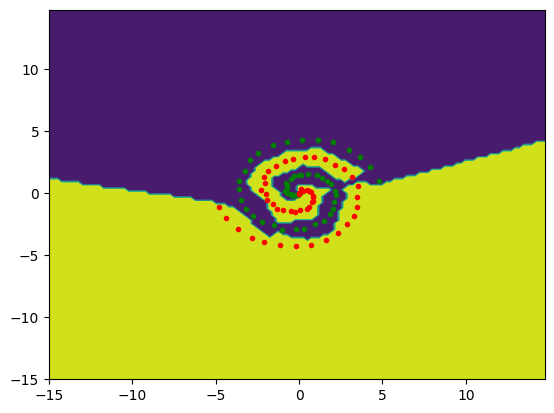

In [ ]:
x_0, y_0, x_1, y_1 = sort_dataset(spiral_dataset)

plt.plot(x_0, y_0, 'g.')
plt.plot(x_1, y_1, 'r.')

# Подготовка графика визуализации обучения нейросети
x_plot = y_plot = np.arange(-15, 15, 0.25)
x_plot_grid, y_plot_grid = np.meshgrid(x_plot, y_plot)
# Метки (labels) графика

d = []
xr_plot = x_plot_grid.ravel()
ry_plot = y_plot_grid.ravel()
for i in range(len(xr_plot)):
  d.append([xr_plot[i], ry_plot[i]])

model.eval()
z_pred = model.forward(torch.tensor(d).type(torch.FloatTensor))
z_labels = np.argmax(z_pred.detach().numpy(), axis=1)
z_labels = z_labels.reshape(x_plot_grid.shape)

# Отображение результата обучения нейросети
plt.contourf(x_plot_grid, y_plot_grid, z_labels)

In [ ]:
cross_validate(2, [5, 3], 2, nn.Tanh, gaussian_dataset, 5, 1000, 0.003, 10)

Epoch [100/1000], Loss: 0.16414624452590942, accuracy 1.0
Epoch [200/1000], Loss: 0.07120747864246368, accuracy 1.0
Epoch [300/1000], Loss: 0.03425116091966629, accuracy 1.0
Epoch [400/1000], Loss: 0.039767276495695114, accuracy 1.0
Epoch [500/1000], Loss: 0.015063134953379631, accuracy 1.0
Epoch [600/1000], Loss: 0.014230778440833092, accuracy 1.0
Epoch [700/1000], Loss: 0.012366588227450848, accuracy 1.0
Epoch [800/1000], Loss: 0.019212208688259125, accuracy 1.0
Epoch [900/1000], Loss: 0.016349386423826218, accuracy 1.0
Epoch [1000/1000], Loss: 0.00718759885057807, accuracy 1.0
Epoch [100/1000], Loss: 0.1971404254436493, accuracy 1.0
Epoch [200/1000], Loss: 0.1153399720788002, accuracy 1.0
Epoch [300/1000], Loss: 0.08733956515789032, accuracy 1.0
Epoch [400/1000], Loss: 0.030431333929300308, accuracy 1.0
Epoch [500/1000], Loss: 0.025090206414461136, accuracy 1.0
Epoch [600/1000], Loss: 0.018883641809225082, accuracy 1.0
Epoch [700/1000], Loss: 0.015236969105899334, accuracy 1.0
Epoch

# Обучение всех моделей, присутствующих в задании и качество их обучения

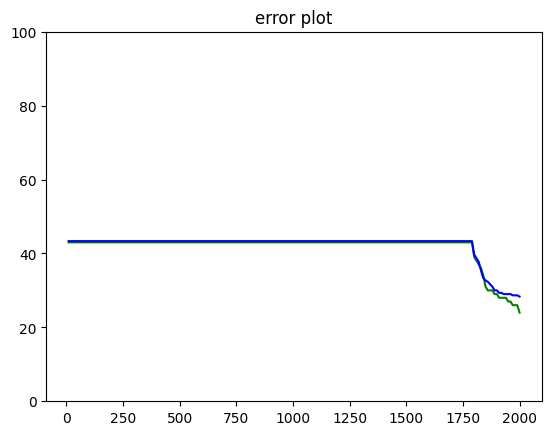

<ipython-input-106-b38ba85219e8>:45: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r." (-> color='r'). The keyword argument will take precedence.
  plt.plot(x_0, y_0, 'r.', color='orange')


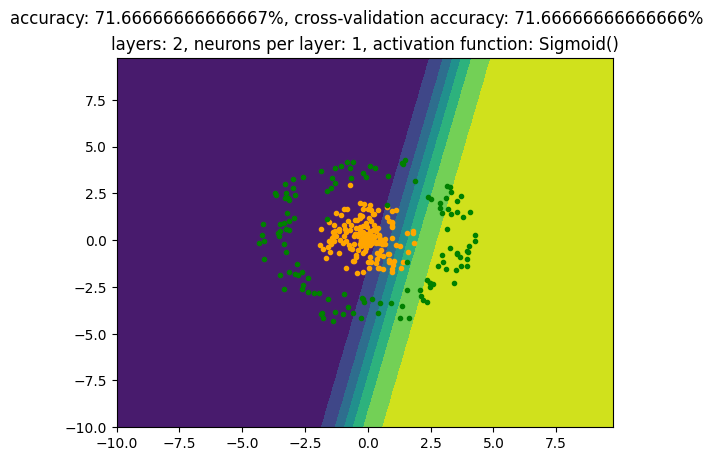

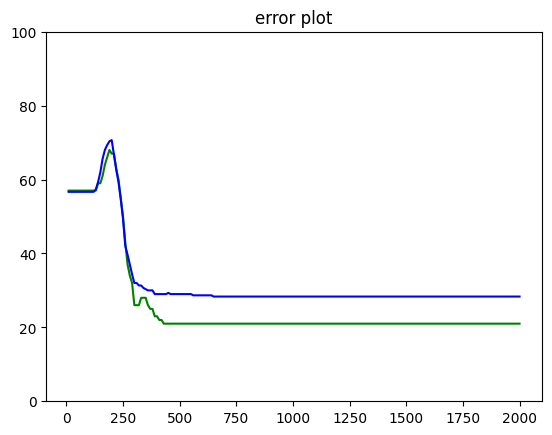

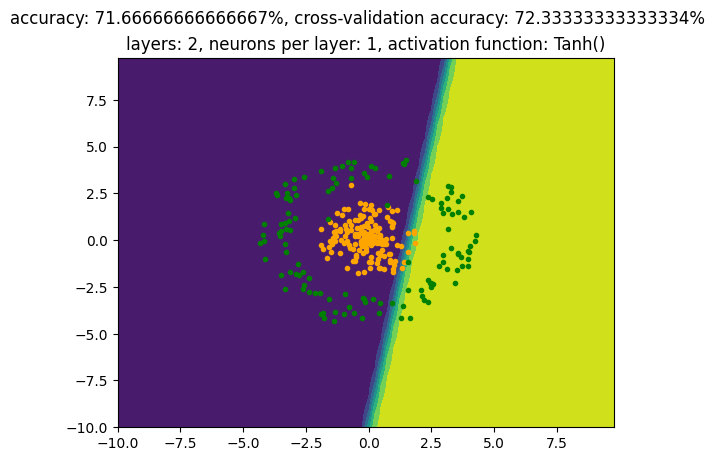

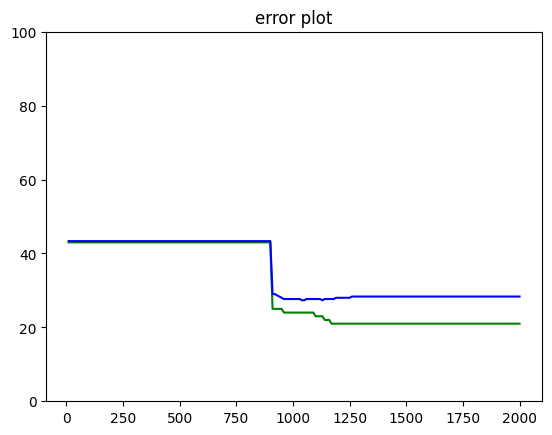

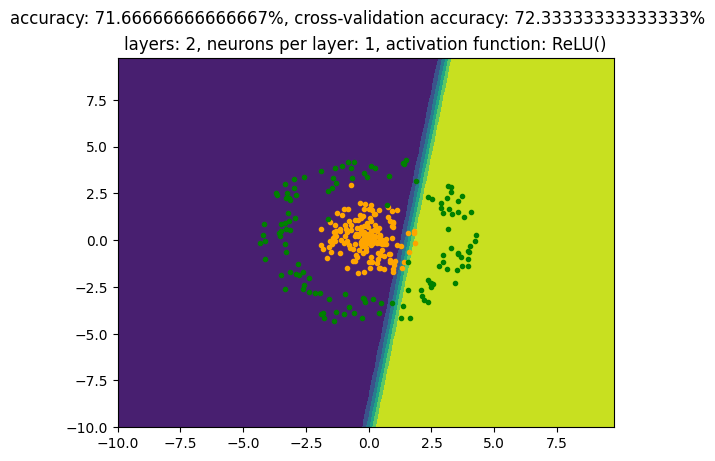

...

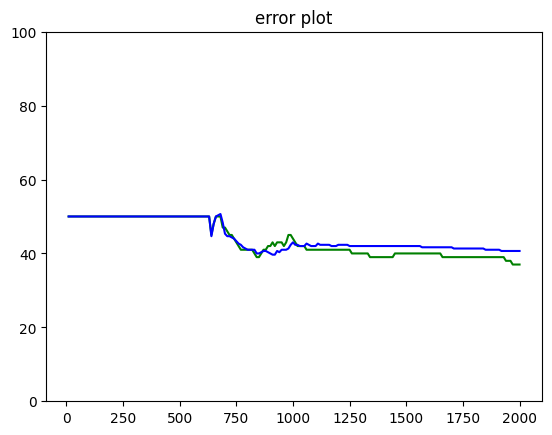

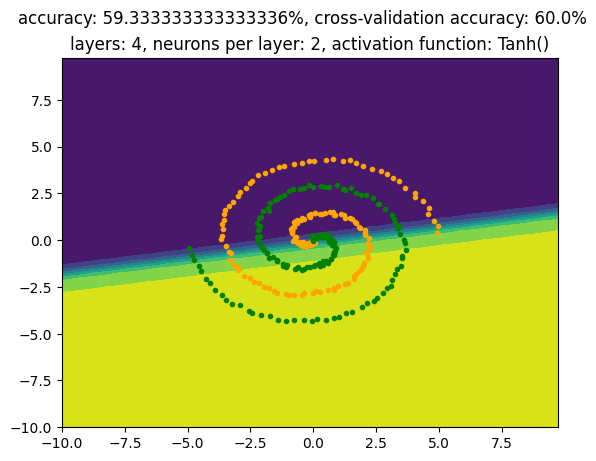

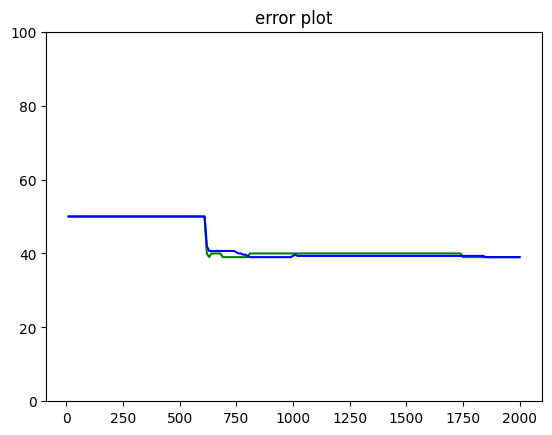

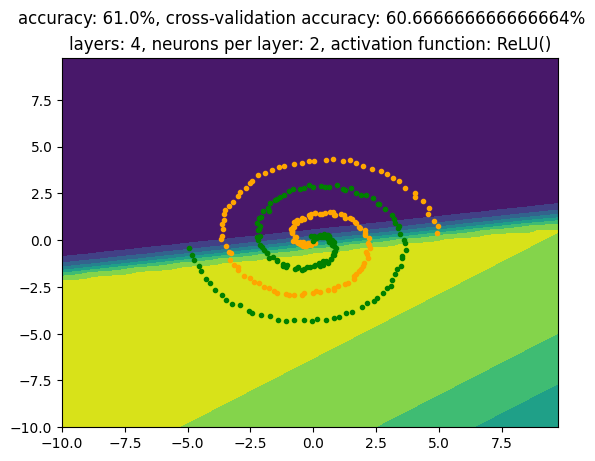

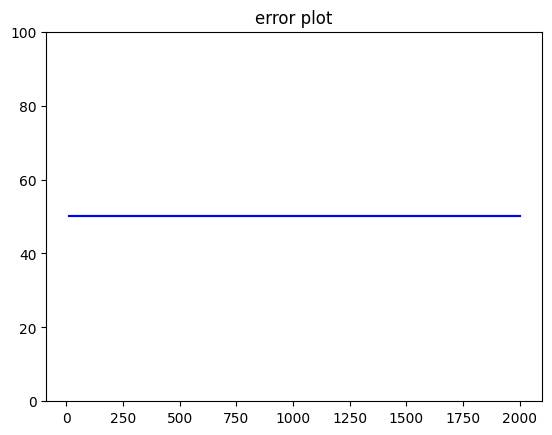

KeyboardInterrupt: 

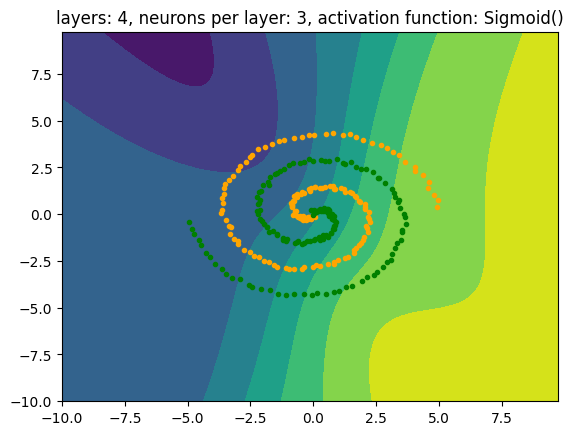

In [ ]:
datasets_with_train = [[circle_dataset, circle_dataset_train], [xor_dataset, xor_dataset_train], [gaussian_dataset, gaussian_dataset_train], [spiral_dataset, spiral_dataset_train]]
epochs = 2000
layers = [2, 3, 4]
neurons_per_layer = [1, 2, 3, 4, 5]
activation_functions = [nn.Sigmoid(), nn.Tanh(), nn.ReLU()]
k = 5
for [dataset, dataset_train] in datasets_with_train:
  for l in layers:
    for n in neurons_per_layer:
      for a_f in activation_functions:
        # Создание модели
        model = MLP(2, 1, l, n, a_f)

        # Функция ошибки
        criterion = nn.CrossEntropyLoss()
        # Оптимизатор
        optimizer = optim.SGD(model.parameters(), lr = 0.003)

        # Преобразование выборок (тестовой и тренировочной) в тензоры pytorch
        x_d_tensor, y_d_tensor = map_to_tensors(dataset, torch.FloatTensor, torch.FloatTensor)
        x_d_train_tensor, y_d_train_tensor = map_to_tensors(dataset_train, torch.FloatTensor, torch.FloatTensor)

        # Обучение модели
        train_errors, test_errors = model.fit(x_d_train_tensor, y_d_train_tensor, x_d_tensor, y_d_tensor, criterion, optimizer, epochs)

        # Создание нового графика для визуализации ошибки
        ax = plt.subplot()
        plt.title(f"error plot")
        arg = [(i+1) * 10 for i in range(len(train_errors))]
        plt.plot(arg, train_errors, 'g-')
        plt.plot(arg, test_errors, 'b-')
        plt.ylim([0, 100])
        plt.show()

        # Перевод модели в режим предсказания
        model.eval()

        # Создание нового графика
        ax = plt.subplot()

        # Сортировка выборки в зависимости от меток
        x_0, y_0, x_1, y_1 = sort_dataset(dataset)

        # Отображение первого класса выборки
        plt.plot(x_0, y_0, 'r.', color='orange')
        # Отображение второго класса выборки
        plt.plot(x_1, y_1, 'g.')

        # Подготовка графика визуализации обучения нейросети
        x_plot = y_plot = np.arange(-10, 10, 0.25)
        x_plot_grid, y_plot_grid = np.meshgrid(x_plot, y_plot)
        # Метки (labels) графика
        z_plot_grid = [[model(torch.tensor([__x, __y]).type(torch.FloatTensor)).cpu().detach().numpy()[0] for __x in x_plot] for __y in y_plot]

        # Отображение результата обучения нейросети
        plt.contourf(x_plot_grid, y_plot_grid, z_plot_grid)

        # Подписи на графике
        plt.title(f"layers: {l}, neurons per layer: {n}, activation function: {a_f}")
        plt.suptitle(f"accuracy: {model.accuracy(x_d_tensor, y_d_tensor)}%, cross-validation accuracy: {np.mean(model.cross_validate(x_d_tensor, y_d_tensor, criterion, optimizer, k, epochs))}%")

        # Показ графика
        plt.show()

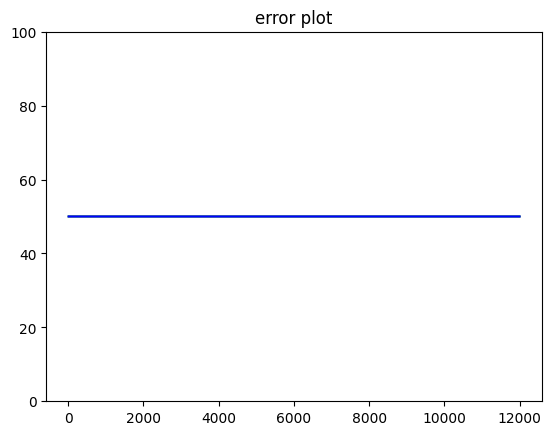

<ipython-input-124-ae5d2a422f99>:40: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r." (-> color='r'). The keyword argument will take precedence.
  plt.plot(x_0, y_0, 'r.', color='orange')


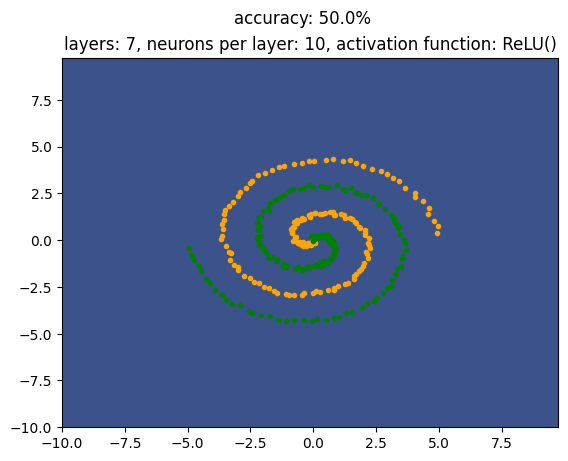

In [ ]:
l = 7
n = 10
a_f = nn.ReLU()
dataset, dataset_train = spiral_dataset, spiral_dataset_train
epochs = 12000
# Создание модели
model = MLP(2, 1, l, n, a_f)

# Функция ошибки
criterion = nn.CrossEntropyLoss()
# Оптимизатор
optimizer = optim.SGD(model.parameters(), lr = 0.001)

# Преобразование выборок (тестовой и тренировочной) в тензоры pytorch
x_d_tensor, y_d_tensor = map_to_tensors(dataset, torch.FloatTensor, torch.FloatTensor)
x_d_train_tensor, y_d_train_tensor = map_to_tensors(dataset_train, torch.FloatTensor, torch.FloatTensor)

# Обучение модели
train_errors, test_errors = model.fit(x_d_train_tensor, y_d_train_tensor, x_d_tensor, y_d_tensor, criterion, optimizer, epochs)

# Создание нового графика для визуализации ошибки
ax = plt.subplot()
plt.title(f"error plot")
arg = [(i+1) * 10 for i in range(len(train_errors))]
plt.plot(arg, train_errors, 'g-')
plt.plot(arg, test_errors, 'b-')
plt.ylim([0, 100])
plt.show()

# Перевод модели в режим предсказания
model.eval()

# Создание нового графика
ax = plt.subplot()

# Сортировка выборки в зависимости от меток
x_0, y_0, x_1, y_1 = sort_dataset(dataset)

# Отображение первого класса выборки
plt.plot(x_0, y_0, 'r.', color='orange')
# Отображение второго класса выборки
plt.plot(x_1, y_1, 'g.')

# Подготовка графика визуализации обучения нейросети
x_plot = y_plot = np.arange(-10, 10, 0.25)
x_plot_grid, y_plot_grid = np.meshgrid(x_plot, y_plot)
# Метки (labels) графика
z_plot_grid = [[model(torch.tensor([__x, __y]).type(torch.FloatTensor)).cpu().detach().numpy()[0] for __x in x_plot] for __y in y_plot]

# Отображение результата обучения нейросети
plt.contourf(x_plot_grid, y_plot_grid, z_plot_grid)

# Подписи на графике
plt.title(f"layers: {l}, neurons per layer: {n}, activation function: {a_f}")
plt.suptitle(f"accuracy: {model.accuracy(x_d_tensor, y_d_tensor)}%")

# Показ графика
plt.show()

# Возможно полезный код

In [ ]:
# def fit(__model, __x_train, __y_train, __x, __y, __error_function, __optimizer, __epochs=20, __train=True):
#   torch.manual_seed(42)

#   for __epoch in range(__epochs):
#     __running_train_loss = 0.0
#     __running_loss = 0.0
#     __model.train()

#     # __xx = torch.from_numpy(__x).type(torch.FloatTensor)
#     # __yy = torch.tensor(__y).type(torch.FloatTensor)
#     __xx_train = __x_train.to(device)
#     __yy_train = __y_train.squeeze().to(device)

#     __y_train_pred = __model(__xx_train).squeeze()

#     __err_train = __error_function(__y_train_pred, __yy_train)

#     __optimizer.zero_grad()

#     __err_train.backward()

#     __optimizer.step()

#     __running_train_loss += __err_train.item()

#     __model.eval()
#     with torch.inference_mode():
#       __xx = __x.to(device)
#       __yy = __y.squeeze().to(device)

#       __y_pred = __model(__xx).squeeze()
#       __err = __error_function(__y_pred, __yy)
#       __running_loss += __err.item()

#     if __epoch % 50 == 0:
#       print(f'Epoch [{__epoch+1}/{__epochs}], train error: {__running_train_loss/len(__x_train)}, error: {__running_loss/len(__x)}')

In [ ]:
# kf = KFold(n_splits=5)
# for train_index, test_index in kf.split(x_d_tensor):
#   X_train, X_test = x_d_tensor[train_index], x_d_tensor[test_index]
#   Y_train, Y_test = y_d_tensor[train_index], y_d_tensor[test_index]

#   model.train()

#   for epoch in range(300):
#     optimizer.zero_grad()
#     output = model(X_train)
#     loss = error_function(output, Y_train)
#     loss.backward()
#     optimizer.step()

#   # Оценка качества модели на тестовых данных
#   with torch.no_grad():
#     output = model(X_test).squeeze()
#     predicted = torch.tensor([1 if __o > 0.5 else 0 for __o in output]).type(torch.FloatTensor)
#     Y_test_squeeze = Y_test.squeeze()
#     print(output)
#     print(predicted)
#     print(Y_test_squeeze)
#     print(predicted == Y_test_squeeze)
#     accuracy = (predicted == Y_test_squeeze).float().mean()

#   print(f'Accuracy: {accuracy.item()}')

[98.33333333333333, 100.0, 98.33333333333333, 100.0, 98.33333333333333]

In [ ]:
  def fit(self, x_train: torch.Tensor, y_train: torch.Tensor, x: torch.Tensor, y: torch.Tensor, criterion, optimizer: optim.Optimizer, epochs: int, silent=True):
    train_errors = []
    test_errors = []
    for epoch in range(epochs):
      self.train()

      output = self.forward(x_train).squeeze()
      loss = criterion(output, y_train.squeeze())

      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      if (epoch+1) % 10 == 0:
        train_errors.append(100 - self.accuracy(x_train, y_train))

      with torch.inference_mode():
        self.eval()

        test_output = self.forward(x).squeeze()
        test_loss = criterion(test_output, y.squeeze())

        if (epoch+1) % 10  == 0:
          test_errors.append(100 - self.accuracy(x, y))

      if not silent and (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{epochs}], Train loss: {loss.item()}, Test loss: {test_loss.item()}')

    return train_errors, test_errors

Визуализация датасета

<ipython-input-139-5d13268e7e49>:3: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "g." (-> color='g'). The keyword argument will take precedence.
  plt.plot(x_0, y_0, 'g.', color="#009900")
<ipython-input-139-5d13268e7e49>:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r." (-> color='r'). The keyword argument will take precedence.
  plt.plot(x_1, y_1, 'r.', color="#990000")
<ipython-input-139-5d13268e7e49>:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "g." (-> color='g'). The keyword argument will take precedence.
  plt.plot(x_0_train, y_0_train, 'g.', color="#00ff00")
<ipython-input-139-5d13268e7e49>:6: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r." (-> color='r'). The keyword argument will take precedence.
  plt.plot(x_1_train, y_1_train, 'r.', color="#ff0000")


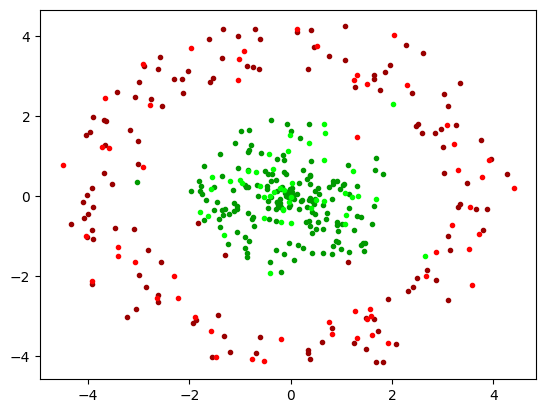

In [ ]:
x_0, y_0, x_1, y_1 = sort_dataset(dataset)
x_0_train, y_0_train, x_1_train, y_1_train = sort_dataset(dataset_train)
plt.plot(x_0, y_0, 'g.', color="#009900")
plt.plot(x_1, y_1, 'r.', color="#990000")
plt.plot(x_0_train, y_0_train, 'g.', color="#00ff00")
plt.plot(x_1_train, y_1_train, 'r.', color="#ff0000")